# Nepal Climate Change Analysis
This notebook analyzes synthetic climate data for Nepal, comparing baseline (2020) and projected (2050) conditions to understand potential climate change impacts.

## 1. Setup and Data Loading

In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap
import os
from rasterio.mask import mask

# Set up matplotlib parameters for better visualization
plt.rcParams['figure.figsize'] = (12, 8)
plt.style.use('seaborn-v0_8-whitegrid')

# Display settings
pd.set_option('display.max_columns', None)

## 2. Data Exploration
Let's load the local administrative unit shapefile and explore its structure:

In [2]:
# Load the local administrative unit shapefile
nepal_local_units = gpd.read_file('Shape_Data/local_unit.shp')

# Display basic information about the shapefile
print("Nepal Local Administrative Units:")
print(f"Total number of units: {len(nepal_local_units)}")
print(f"Columns available: {nepal_local_units.columns.tolist()}")
print("\nProvince distribution:")
print(nepal_local_units['Province'].value_counts())
print("\nUnit type distribution:")
print(nepal_local_units['Type_GN'].value_counts())

# Display the first few rows
nepal_local_units.head()

Nepal Local Administrative Units:
Total number of units: 777
Columns available: ['STATE_CODE', 'DISTRICT', 'GaPa_NaPa', 'Type_GN', 'Province', 'geometry']

Province distribution:
Province
2                 140
1                 139
Bagmati           124
5                 113
Sudur Pashchim     93
Gandaki            89
Karnali            79
Name: count, dtype: int64

Unit type distribution:
Type_GN
Gaunpalika                        461
Nagarpalika                       277
Upamahanagarpalika                 11
National Park                      11
Mahanagarpalika                     6
Wildlife Reserve                    6
Hunting Reserve                     3
Watershed and Wildlife Reserve      1
Development Area                    1
Name: count, dtype: int64


,STATE_CODE,DISTRICT,GaPa_NaPa,Type_GN,Province,geometry
0,1,TAPLEJUNG,Aathrai Tribeni,Gaunpalika,1,"POLYGON ((87.60985 27.37043, 87.61107 27.36943..."
1,1,TAPLEJUNG,Maiwakhola,Gaunpalika,1,"POLYGON ((87.50402 27.42901, 87.50672 27.42831..."
2,1,TAPLEJUNG,Meringden,Gaunpalika,1,"POLYGON ((87.51272 27.56894, 87.51255 27.56859..."
3,1,TAPLEJUNG,Mikwakhola,Gaunpalika,1,"POLYGON ((87.6885 27.70975, 87.68891 27.70938,..."
4,1,TAPLEJUNG,Phaktanglung,Gaunpalika,1,"POLYGON ((87.83673 27.95137, 87.83735 27.95119..."


## 3. Load Climate Data
Let's load the climate data files:

In [3]:
# List the files in the nepal_climate_data directory
data_files = os.listdir('nepal_climate_data')
print("Available data files:", data_files)

# Load temperature data (2020 and 2050)
temp_2020 = rasterio.open('nepal_climate_data/nepal_temperature_2020.tif')
temp_2050 = rasterio.open('nepal_climate_data/nepal_temperature_2050.tif')

# Load precipitation data (2020 and 2050)
precip_2020 = rasterio.open('nepal_climate_data/nepal_precipitation_2020.tif')
precip_2050 = rasterio.open('nepal_climate_data/nepal_precipitation_2050.tif')

# Load additional vector data
admin_regions = gpd.read_file('nepal_climate_data/nepal_admin_regions.gpkg')
rivers = gpd.read_file('nepal_climate_data/nepal_rivers.gpkg')
glaciers = gpd.read_file('nepal_climate_data/nepal_glaciers.gpkg')

Available data files: ['metadata.json', 'nepal_admin_regions.gpkg', 'nepal_glaciers.gpkg', 'nepal_precipitation_2020.tif', 'nepal_precipitation_2050.tif', 'nepal_rivers.gpkg', 'nepal_temperature_2020.tif', 'nepal_temperature_2050.tif']


### 4. Visualize Nepal's Administrative Boundaries
Let's create a map of Nepal showing the administrative units:

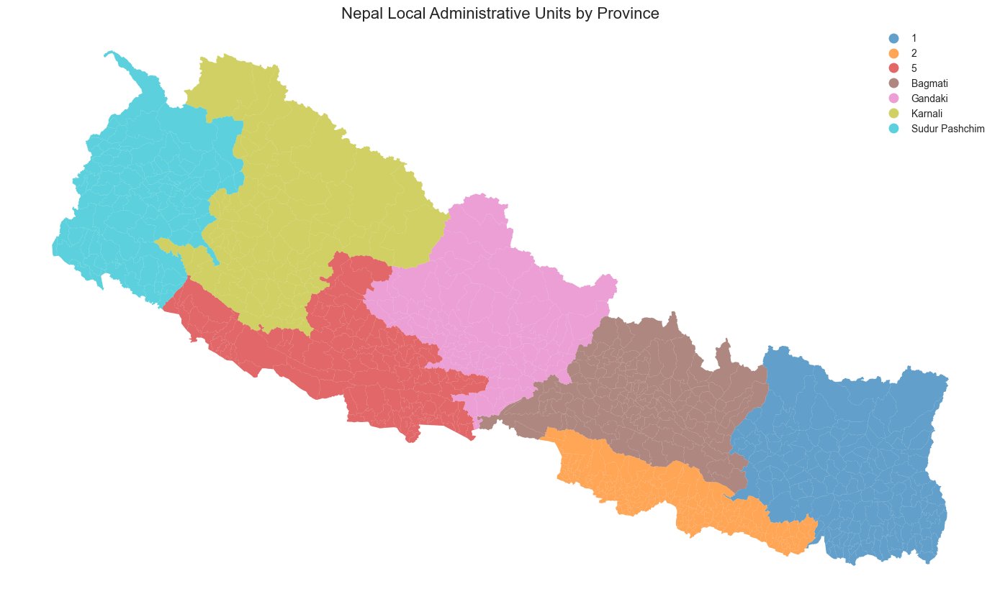

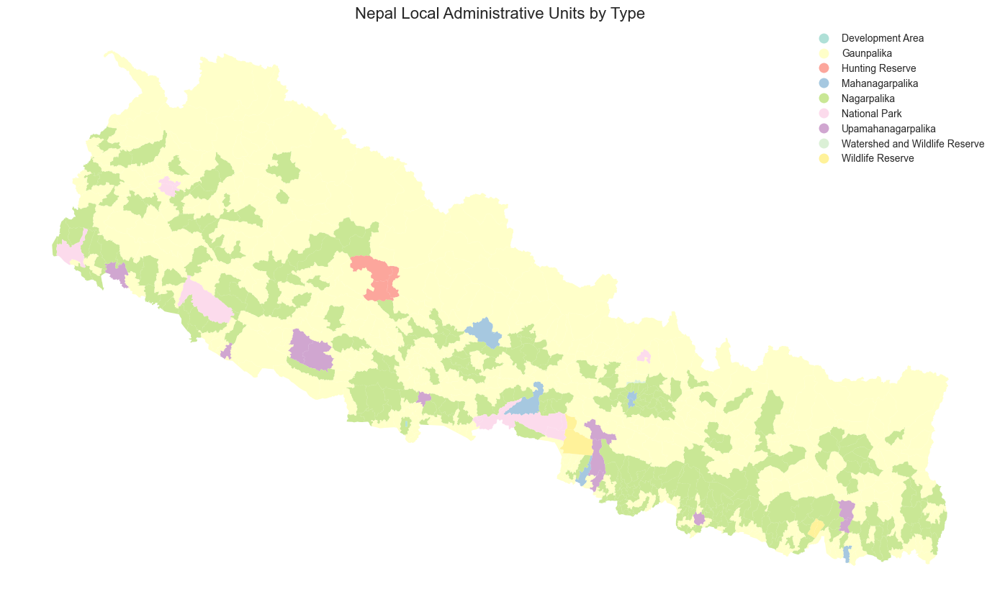

In [4]:
# Ensure the CRS is consistent (use WGS84)
nepal_local_units = nepal_local_units.to_crs("EPSG:4326")

# Plot the administrative units by Province
fig, ax = plt.subplots(figsize=(14, 10))
nepal_local_units.plot(column='Province', 
                       categorical=True, 
                       legend=True,
                       ax=ax,
                       cmap='tab10',
                       alpha=0.7)

# Add title and remove axis
plt.title('Nepal Local Administrative Units by Province', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

# Plot the administrative units by type (Rural/Urban)
fig, ax = plt.subplots(figsize=(14, 10))
nepal_local_units.plot(column='Type_GN', 
                       categorical=True, 
                       legend=True,
                       ax=ax,
                       cmap='Set3',
                       alpha=0.7)

# Add title and remove axis
plt.title('Nepal Local Administrative Units by Type', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

## 5. Temperature Analysis
5.1 Monthly Temperature Changes

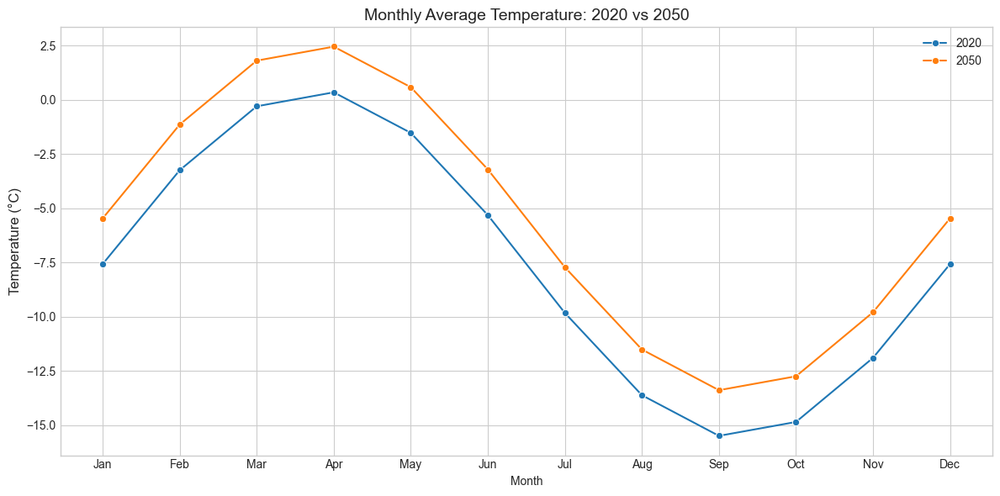

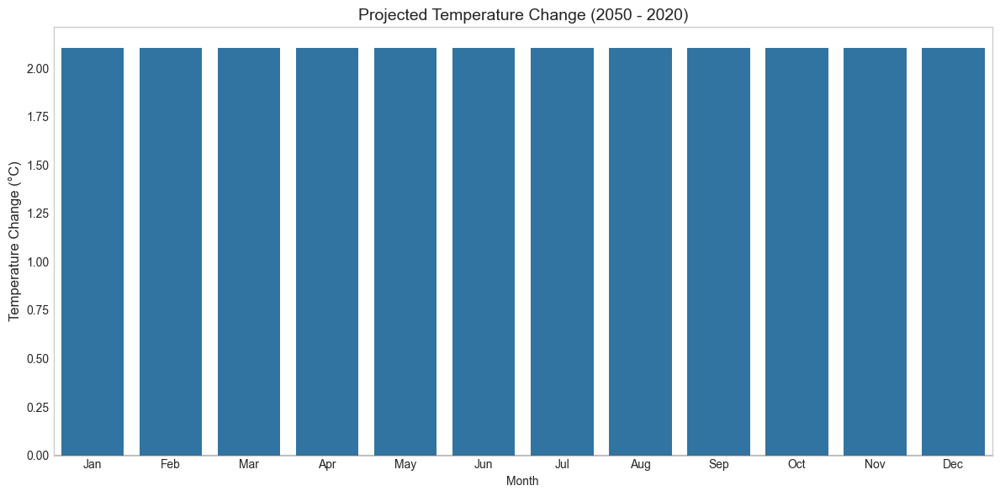

In [5]:
# Function to calculate monthly average temperature from raster data
def get_monthly_avg_temp(temp_data):
    monthly_avg = []
    for i in range(1, temp_data.count + 1):
        band = temp_data.read(i)
        monthly_avg.append(np.mean(band))
    return monthly_avg

# Calculate monthly average temperatures
temp_2020_avg = get_monthly_avg_temp(temp_2020)
temp_2050_avg = get_monthly_avg_temp(temp_2050)

# Create a dataframe for temperature data
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
temp_df = pd.DataFrame({
    'Month': months,
    'Temp_2020': temp_2020_avg,
    'Temp_2050': temp_2050_avg
})
temp_df['Change'] = temp_df['Temp_2050'] - temp_df['Temp_2020']

# Plot temperature changes
plt.figure(figsize=(12, 6))
sns.lineplot(data=temp_df, x='Month', y='Temp_2020', marker='o', label='2020')
sns.lineplot(data=temp_df, x='Month', y='Temp_2050', marker='o', label='2050')
plt.title('Monthly Average Temperature: 2020 vs 2050', fontsize=14)
plt.ylabel('Temperature (°C)', fontsize=12)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Bar plot of temperature changes
plt.figure(figsize=(12, 6))
sns.barplot(data=temp_df, x='Month', y='Change')
plt.title('Projected Temperature Change (2050 - 2020)', fontsize=14)
plt.ylabel('Temperature Change (°C)', fontsize=12)
plt.grid(axis='y')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.tight_layout()
plt.show()

## 5.2 Temperature Maps with Nepal's Administrative Boundaries

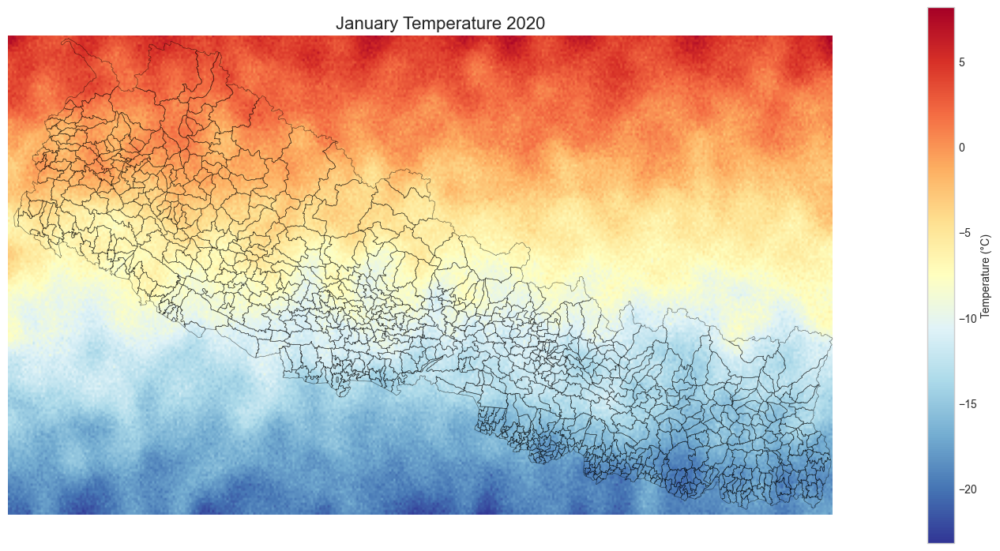

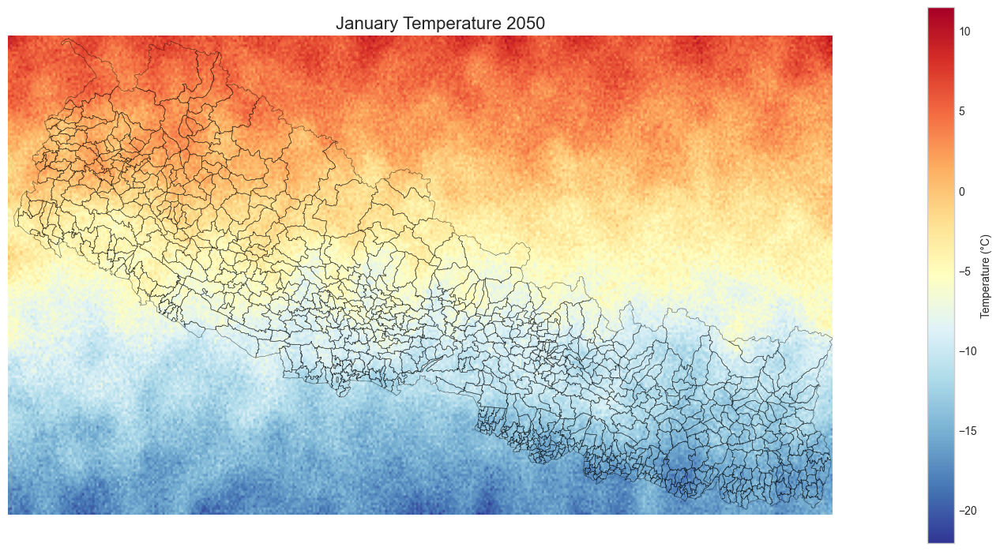

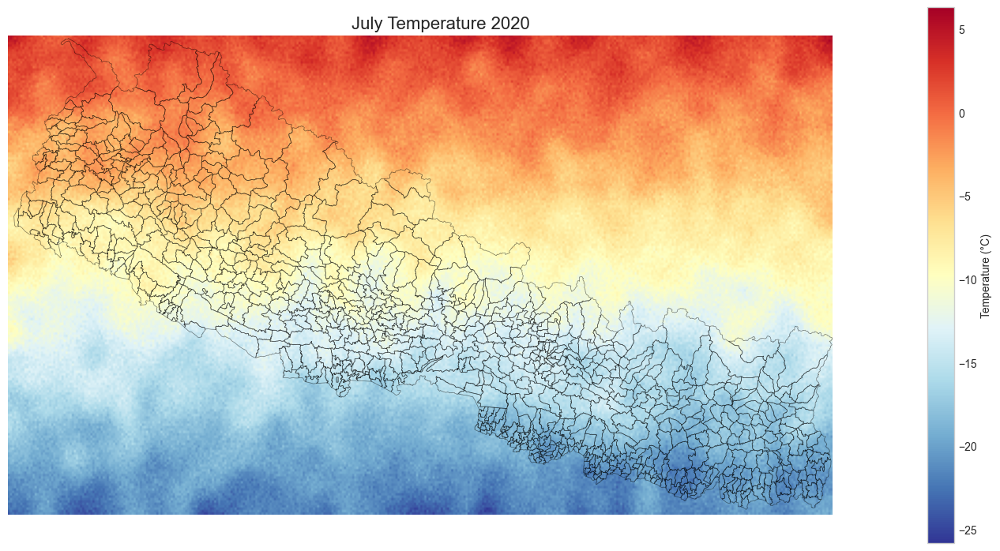

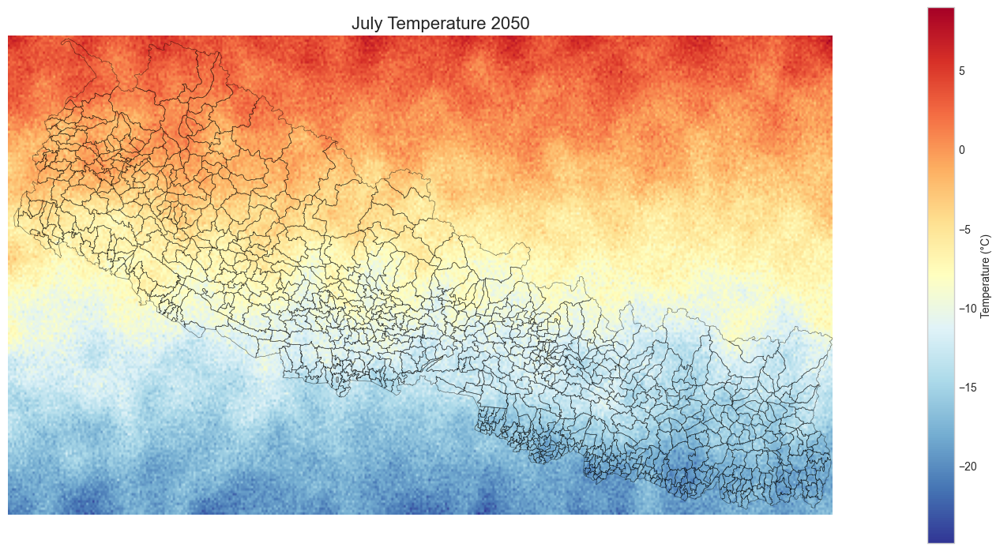

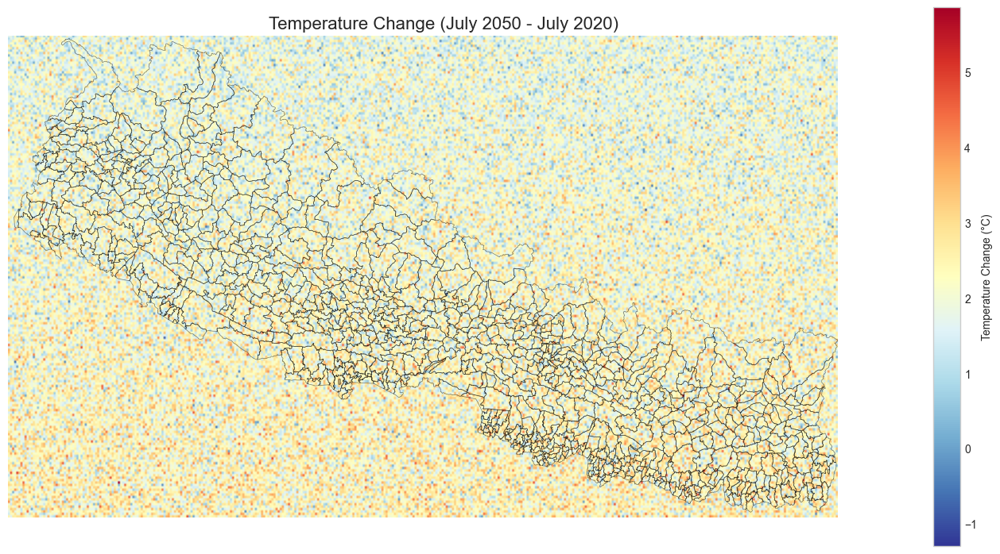

In [ ]:
def plot_raster_with_boundaries(raster, band_idx, title, cmap='RdYlBu_r'):
    band = raster.read(band_idx)

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(14, 10))

    # Extract extent from raster.bounds
    extent = [raster.bounds.left, raster.bounds.right, raster.bounds.bottom, raster.bounds.top]

    # Plot the raster using imshow with explicit extent
    im = ax.imshow(band, cmap=cmap, extent=extent)

    # Plot Nepal's administrative boundaries
    if 'nepal_local_units' in globals():
        nepal_local_units.boundary.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)

    # Add title and remove axis
    ax.set_title(title, fontsize=16)
    ax.set_axis_off()

    # Add colorbar (using the mappable object 'im')
    cbar = plt.colorbar(im, ax=ax, shrink=0.7)
    if 'temp' in title.lower():
        cbar.set_label('Temperature (°C)')
    elif 'precip' in title.lower():
        cbar.set_label('Precipitation (mm)')

    plt.tight_layout()
    plt.show()

# Plot temperature maps for January and July (2020 and 2050)
# January (winter)
plot_raster_with_boundaries(temp_2020, 1, 'January Temperature 2020')
plot_raster_with_boundaries(temp_2050, 1, 'January Temperature 2050')

# July (summer)
plot_raster_with_boundaries(temp_2020, 7, 'July Temperature 2020')
plot_raster_with_boundaries(temp_2050, 7, 'July Temperature 2050')

# Plot temperature change map for July
july_2020 = temp_2020.read(7)
july_2050 = temp_2050.read(7)
temp_change = july_2050 - july_2020

fig, ax = plt.subplots(figsize=(14, 10))
extent = [temp_2020.bounds.left, temp_2020.bounds.right, temp_2020.bounds.bottom, temp_2020.bounds.top]
im = ax.imshow(temp_change, cmap='RdYlBu_r', extent=extent)
if 'nepal_local_units' in globals():
    nepal_local_units.boundary.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)
ax.set_title('Temperature Change (July 2050 - July 2020)', fontsize=16)
ax.set_axis_off()
cbar = plt.colorbar(im, ax=ax, shrink=0.7)
cbar.set_label('Temperature Change (°C)')
plt.tight_layout()
plt.show()

## 6. Precipitation Analysis
### 6.1 Monthly Precipitation Changes

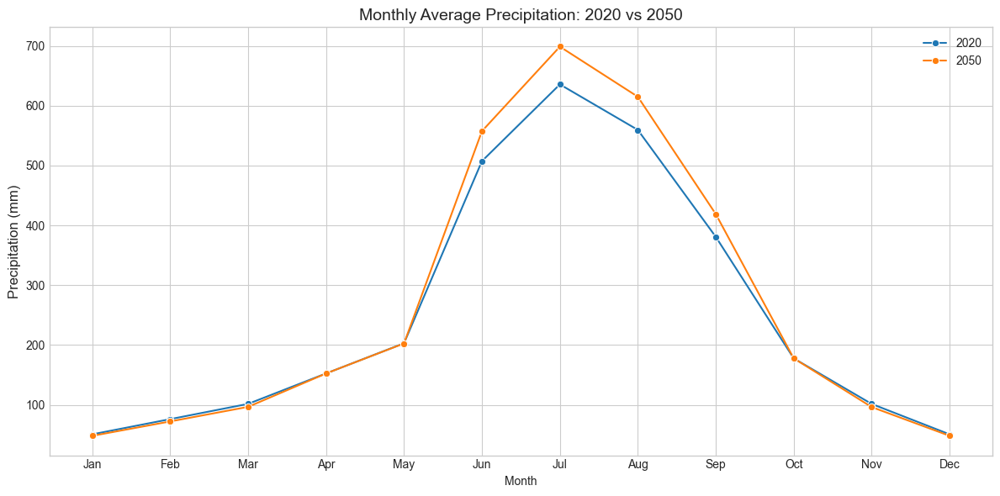

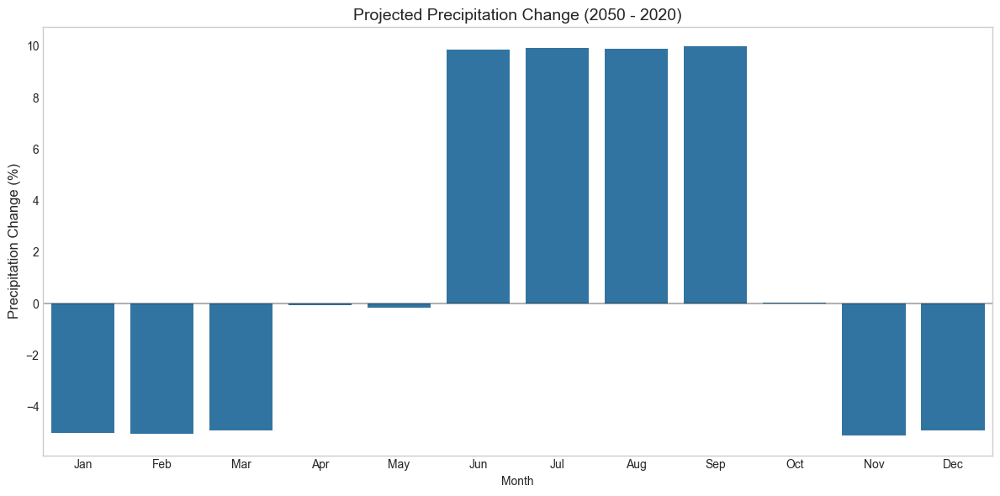

In [7]:
# Function to calculate monthly average precipitation from raster data
def get_monthly_avg_precip(precip_data):
    monthly_avg = []
    for i in range(1, precip_data.count + 1):
        band = precip_data.read(i)
        monthly_avg.append(np.mean(band))
    return monthly_avg

# Calculate monthly average precipitation
precip_2020_avg = get_monthly_avg_precip(precip_2020)
precip_2050_avg = get_monthly_avg_precip(precip_2050)

# Create a dataframe for precipitation data
precip_df = pd.DataFrame({
    'Month': months,
    'Precip_2020': precip_2020_avg,
    'Precip_2050': precip_2050_avg
})
precip_df['Change'] = precip_df['Precip_2050'] - precip_df['Precip_2020']
precip_df['Change_Percent'] = (precip_df['Change'] / precip_df['Precip_2020']) * 100

# Plot precipitation changes
plt.figure(figsize=(12, 6))
sns.lineplot(data=precip_df, x='Month', y='Precip_2020', marker='o', label='2020')
sns.lineplot(data=precip_df, x='Month', y='Precip_2050', marker='o', label='2050')
plt.title('Monthly Average Precipitation: 2020 vs 2050', fontsize=14)
plt.ylabel('Precipitation (mm)', fontsize=12)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Bar plot of precipitation changes
plt.figure(figsize=(12, 6))
sns.barplot(data=precip_df, x='Month', y='Change_Percent')
plt.title('Projected Precipitation Change (2050 - 2020)', fontsize=14)
plt.ylabel('Precipitation Change (%)', fontsize=12)
plt.grid(axis='y')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
plt.tight_layout()
plt.show()

### 6.2 Precipitation Maps with Nepal's Administrative Boundaries

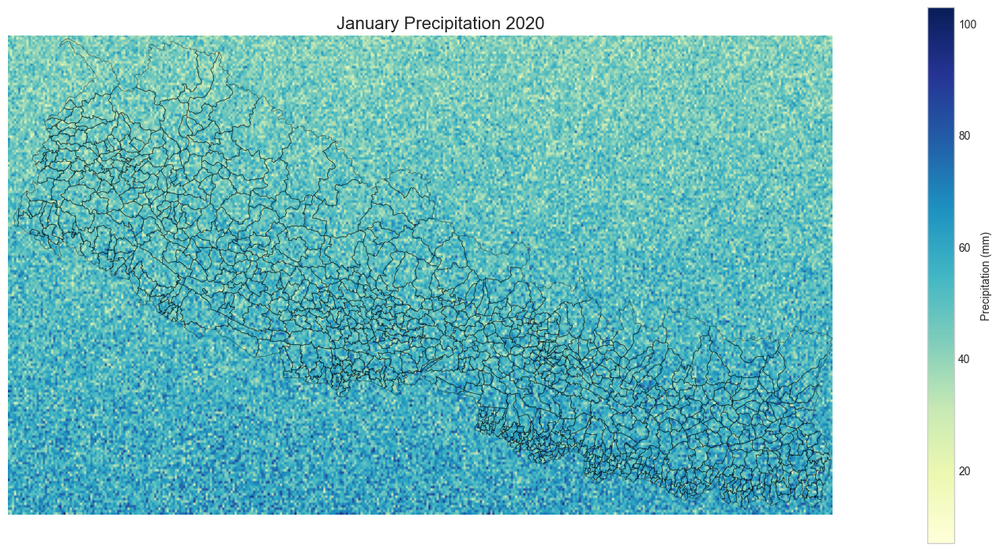

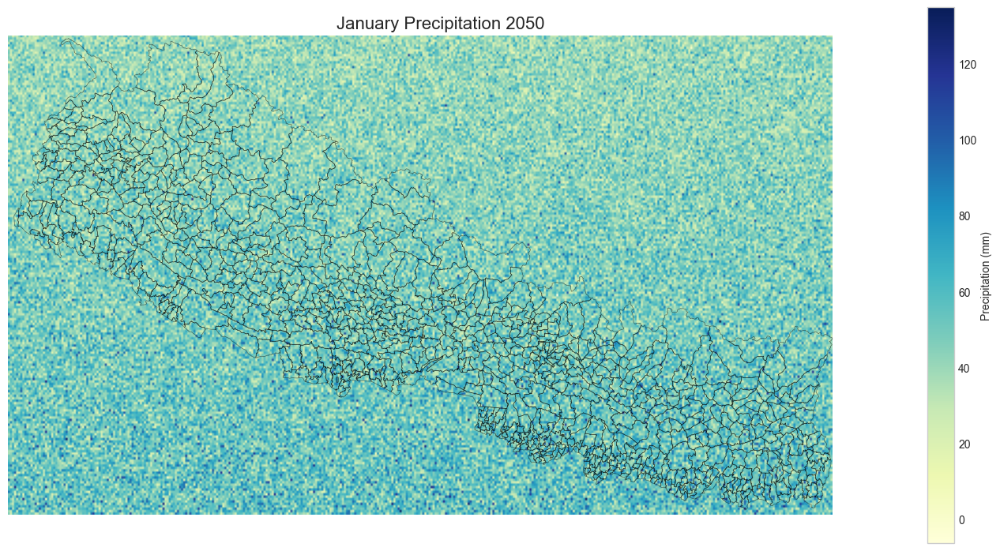

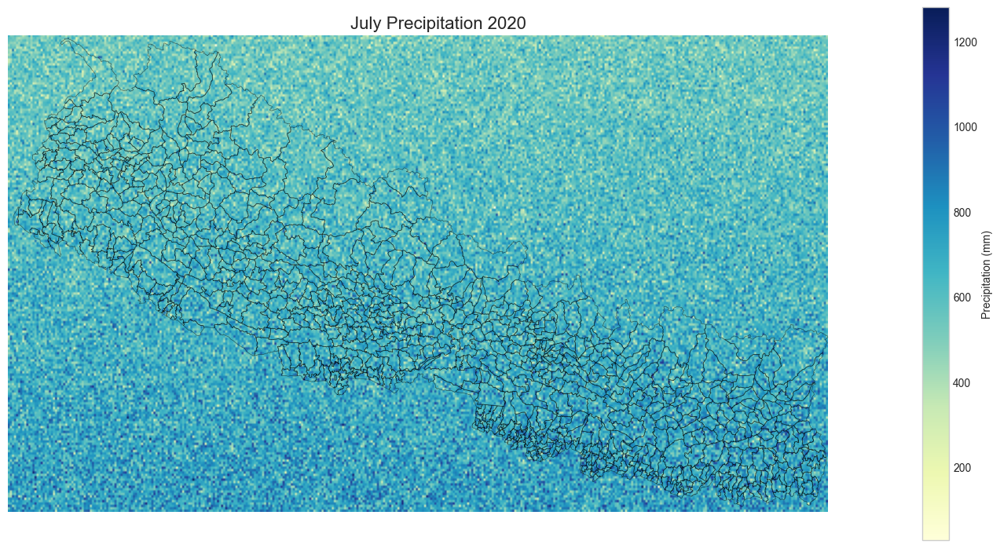

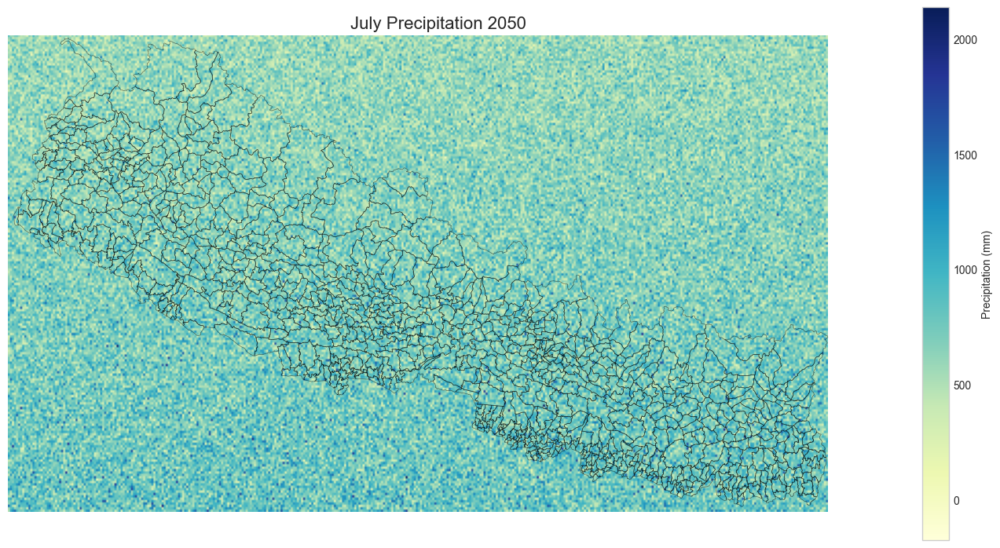

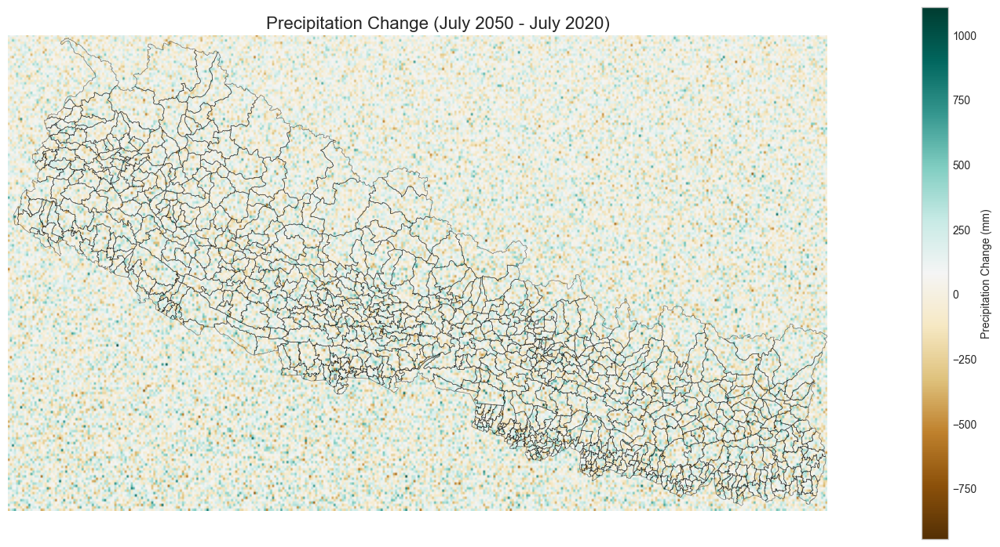

In [ ]:
def plot_raster_with_boundaries(raster, band_idx, title, cmap='YlGnBu'): 
    band = raster.read(band_idx)

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(14, 10))

    # Extract extent from raster.bounds
    extent = [raster.bounds.left, raster.bounds.right, raster.bounds.bottom, raster.bounds.top]

    # Plot the raster using imshow with explicit extent
    im = ax.imshow(band, cmap=cmap, extent=extent)

    # Plot Nepal's administrative boundaries
    if 'nepal_local_units' in globals():
        nepal_local_units.boundary.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)

    # Add title and remove axis
    ax.set_title(title, fontsize=16)
    ax.set_axis_off()

    # Add colorbar (using the mappable object 'im')
    cbar = plt.colorbar(im, ax=ax, shrink=0.7)
    if 'temp' in title.lower():
        cbar.set_label('Temperature (°C)')
    elif 'precip' in title.lower():
        cbar.set_label('Precipitation (mm)')

    plt.tight_layout()
    plt.show()

# Plot precipitation maps for January and July (2020 and 2050)
# January (dry season)
plot_raster_with_boundaries(precip_2020, 1, 'January Precipitation 2020')
plot_raster_with_boundaries(precip_2050, 1, 'January Precipitation 2050')

# July (monsoon season)
plot_raster_with_boundaries(precip_2020, 7, 'July Precipitation 2020')
plot_raster_with_boundaries(precip_2050, 7, 'July Precipitation 2050')

# Plot precipitation change map for July
july_2020_precip = precip_2020.read(7)
july_2050_precip = precip_2050.read(7)
precip_change = july_2050_precip - july_2020_precip

fig, ax = plt.subplots(figsize=(14, 10))
extent = [precip_2020.bounds.left, precip_2020.bounds.right, precip_2020.bounds.bottom, precip_2020.bounds.top]
im = ax.imshow(precip_change, cmap='BrBG', extent=extent)
if 'nepal_local_units' in globals():
    nepal_local_units.boundary.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)
ax.set_title('Precipitation Change (July 2050 - July 2020)', fontsize=16)
ax.set_axis_off()
cbar = plt.colorbar(im, ax=ax, shrink=0.7)
cbar.set_label('Precipitation Change (mm)')
plt.tight_layout()
plt.show()

## 7. Provincial Climate Analysis
Let's analyze climate change impacts by province:

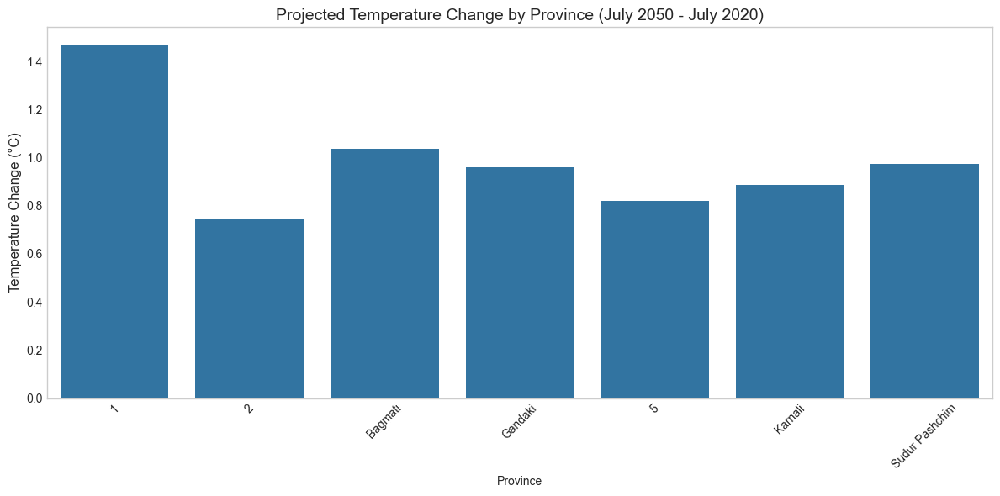

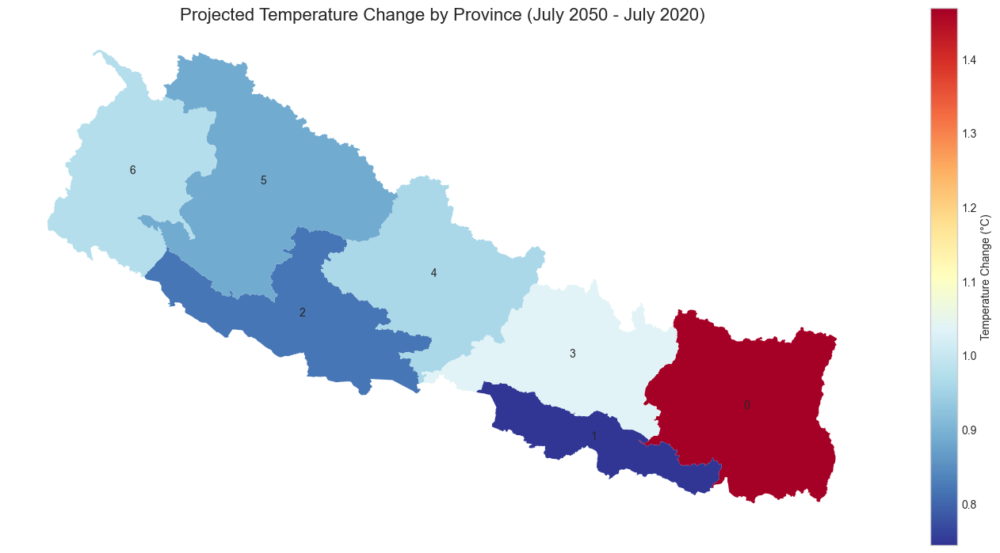

In [ ]:
# Function to extract average values for each province
def extract_provincial_data(raster, province_gdf, band_idx):
    # Ensure the CRS is consistent
    province_gdf = province_gdf.to_crs(raster.crs)

    # Create a dictionary to store results
    province_data = {}

    # Group by province
    for province in province_gdf['Province'].unique():
        # Get geometries for this province
        province_geom = province_gdf[province_gdf['Province'] == province].geometry

        # Extract values using the mask function
        if not province_geom.empty:
            # Combine all geometries in the province
            union_geom = province_geom.union_all() 

            # Use the mask function to extract values
            out_image, out_transform = mask(raster, [union_geom], crop=True)

            province_data[province] = np.mean(out_image[band_idx-1])

    return province_data

# Extract temperature data by province for July
try:
    temp_2020_provincial = extract_provincial_data(temp_2020, nepal_local_units, 7)  # July
    temp_2050_provincial = extract_provincial_data(temp_2050, nepal_local_units, 7)  # July

    # Create a dataframe for provincial temperature data
    temp_provincial_df = pd.DataFrame({
        'Province': list(temp_2020_provincial.keys()),
        'Temp_2020': list(temp_2020_provincial.values()),
        'Temp_2050': list(temp_2050_provincial.values())
    })

    temp_provincial_df['Change'] = temp_provincial_df['Temp_2050'] - temp_provincial_df['Temp_2020']

    # Plot provincial temperature changes
    plt.figure(figsize=(12, 6))
    sns.barplot(data=temp_provincial_df, x='Province', y='Change')
    plt.title('Projected Temperature Change by Province (July 2050 - July 2020)', fontsize=14)
    plt.ylabel('Temperature Change (°C)', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

    # Create a map of temperature change by province
    # Join the temperature data to the province boundaries
    province_map = nepal_local_units.dissolve(by='Province')
    province_map = province_map.merge(temp_provincial_df, on='Province')

    # Plot the map
    fig, ax = plt.subplots(figsize=(14, 10))
    province_map.plot(column='Change',
                    cmap='RdYlBu_r',
                    legend=True,
                    ax=ax,
                    legend_kwds={'label': 'Temperature Change (°C)', 'shrink': 0.7})

    # Add province labels
    for idx, row in province_map.iterrows():
        plt.annotate(text=idx,
                        xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                        ha='center')

    plt.title('Projected Temperature Change by Province (July 2050 - July 2020)', fontsize=16)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
except Exception as e:
    print(f"Error in provincial analysis: {e}")
    print("Continuing with the rest of the analysis...")

## 8. River Flow and Glacier Analysis

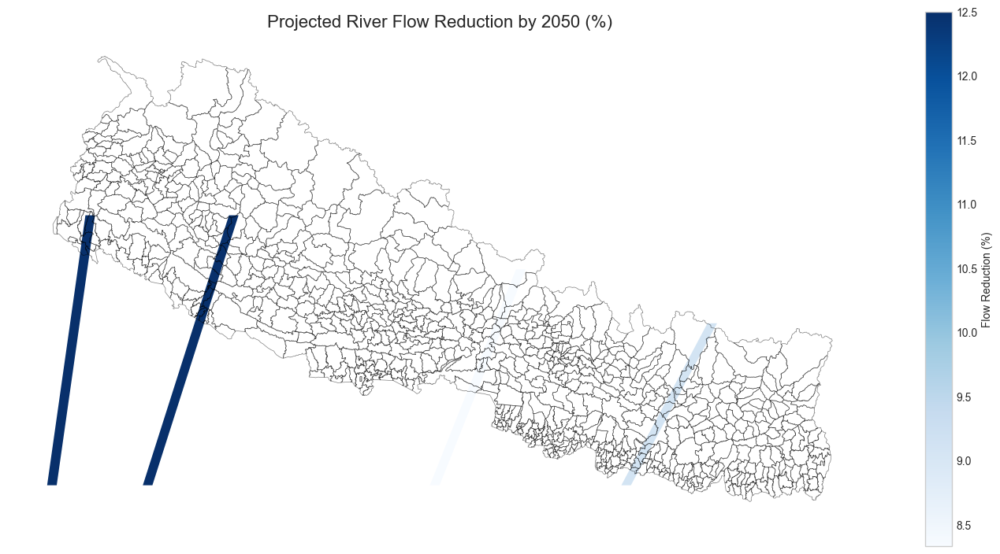

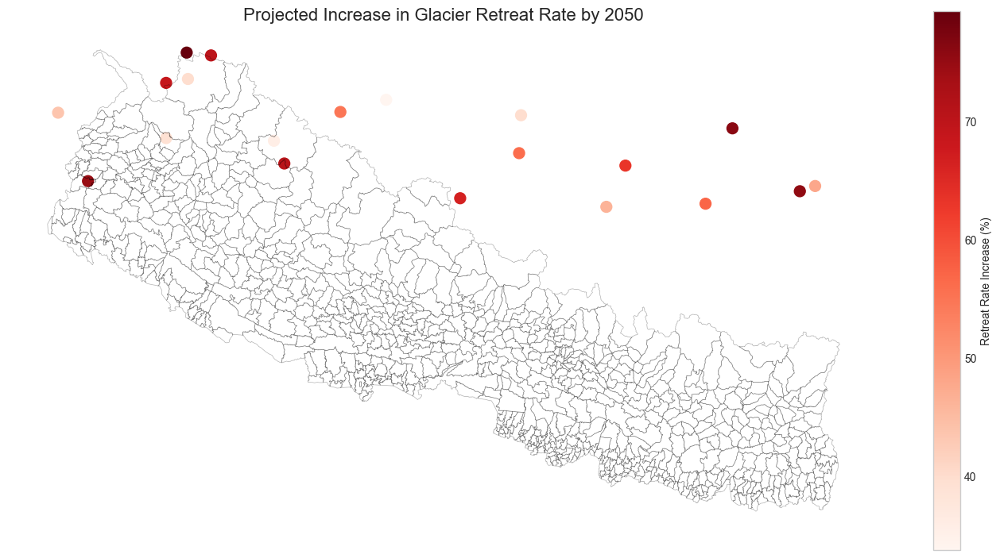

In [10]:
# Analyze river flow changes
fig, ax = plt.subplots(figsize=(14, 10))
nepal_local_units.boundary.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)
rivers.plot(column='flow_reduction_pct', 
           cmap='Blues', 
           legend=True, 
           ax=ax,
           linewidth=2,
           legend_kwds={'label': 'Flow Reduction (%)', 'shrink': 0.7})
plt.title('Projected River Flow Reduction by 2050 (%)', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

# Plot glacier retreat patterns
fig, ax = plt.subplots(figsize=(14, 10))
nepal_local_units.boundary.plot(ax=ax, color='black', linewidth=0.5, alpha=0.3)
glaciers.plot(column='increase_pct', 
             cmap='Reds', 
             legend=True, 
             ax=ax,
             markersize=100,
             legend_kwds={'label': 'Retreat Rate Increase (%)', 'shrink': 0.7})
plt.title('Projected Increase in Glacier Retreat Rate by 2050', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

## 9. Summary and Conclusions

In [11]:
# Calculate key metrics
mean_temp_increase = np.mean(temp_df['Change'])
max_temp_increase = np.max(temp_df['Change'])
monsoon_precip_change = np.mean(precip_df.loc[5:8, 'Change_Percent'])  # Jun-Sep
avg_river_flow_reduction = np.mean(rivers['flow_reduction_pct'])
avg_glacier_retreat_increase = np.mean(glaciers['increase_pct'])

# Summary table
summary_data = {
    'Metric': [
        'Average Annual Temperature Increase', 
        'Maximum Monthly Temperature Increase',
        'Monsoon Season Precipitation Change',
        'Average River Flow Reduction',
        'Average Glacier Retreat Rate Increase'
    ],
    'Value': [
        f"{mean_temp_increase:.2f}°C",
        f"{max_temp_increase:.2f}°C",
        f"{monsoon_precip_change:.2f}%",
        f"{avg_river_flow_reduction:.2f}%",
        f"{avg_glacier_retreat_increase:.2f}%"
    ]
}

summary_df = pd.DataFrame(summary_data)
print("\nSummary of Climate Change Impacts in Nepal (2020 to 2050):")
display(summary_df)

# Close raster files
temp_2020.close()
temp_2050.close()
precip_2020.close()
precip_2050.close()


Summary of Climate Change Impacts in Nepal (2020 to 2050):


,Metric,Value
0,Average Annual Temperature Increase,2.11°C
1,Maximum Monthly Temperature Increase,2.11°C
2,Monsoon Season Precipitation Change,9.92%
3,Average River Flow Reduction,10.61%
4,Average Glacier Retreat Rate Increase,56.95%


## 10. Conclusions
This analysis of synthetic climate data for Nepal shows significant projected changes between 2020 and 2050:

1) Temperature is expected to increase across all provinces, with higher elevation regions experiencing greater warming.
2) Precipitation patterns are changing, with generally more intense monsoon seasons and drier dry seasons.
3) River flows are projected to decrease, potentially affecting water resources and hydropower.
4) Glacier retreat rates are accelerating, which will impact long-term water availability.